# 🌊 Massachusetts Water Quality Analysis - Watershed Preservation Opportunity Map

## Comprehensive Exploratory Data Analysis

This notebook provides extensive visual analysis of Massachusetts water quality data to identify conservation priorities, stormwater stress indicators, and ecosystem instability patterns.

### 🎯 Analysis Objectives:
1. Identify water quality hotspots for conservation
2. Detect stormwater stress indicators (high conductivity & TDS)
3. Find areas with unstable DO and pH levels
4. Map stations with repeated problems
5. Create actionable insights for land preservation

---

## 📦 Setup and Library Imports

In [3]:
# Import required libraries
import pandas as pd
import numpy as np
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Mapping
import folium
from folium import plugins

# Statistics
from scipy import stats

# Configure visualization settings
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')
%matplotlib inline

print('✅ All libraries loaded successfully!')
print(f'📅 Analysis Date: {datetime.now().strftime("%Y-%m-%d %H:%M")}')

✅ All libraries loaded successfully!
📅 Analysis Date: 2025-11-15 11:50


## 📂 Data Loading

In [6]:
# Load the water quality data
df = pd.read_csv('sample_water_quality.csv')

# Convert date columns
df['Sample_Date'] = pd.to_datetime(df['Sample_Date'], errors='coerce')
df['Quality_Control_Date'] = pd.to_datetime(df['Quality_Control_Date'], errors='coerce')

# Add temporal features
df['Year'] = df['Sample_Date'].dt.year
df['Month'] = df['Sample_Date'].dt.month
df['Month_Name'] = df['Sample_Date'].dt.strftime('%B')
df['Season'] = df['Sample_Date'].dt.month%12 // 3 + 1
df['Season_Name'] = df['Season'].map({1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Fall'})

print(f"✅ Data loaded: {df.shape[0]:,} records, {df.shape[1]} columns")
print(f"📅 Date range: {df['Sample_Date'].min().date()} to {df['Sample_Date'].max().date()}")
print(f"📍 Unique stations: {df['Station_ID'].nunique()}")
print(f"💧 Watersheds: {df['Watershed_Name'].nunique()}")

✅ Data loaded: 12,596 records, 53 columns
📅 Date range: 2005-01-18 to 2020-09-16
📍 Unique stations: 1320
💧 Watersheds: 32


## 1️⃣ Data Overview & Quality Assessment

In [9]:
# Dataset overview statistics
print("📊 DATASET OVERVIEW")
print("="*60)
print(f"Total Records: {len(df):,}")
print(f"Years Covered: {df['Year'].nunique()} ({df['Year'].min()} - {df['Year'].max()})")
print(f"\n🗺️ Geographic Coverage:")
print(f"  • Unique Stations: {df['Station_ID'].nunique()}")
print(f"  • Watersheds: {df['Watershed_Name'].nunique()}")
print(f"  • Water Bodies: {df['Water_Body_Name'].nunique()}")
print(f"  • Latitude Range: {df['Latitude'].min():.4f} to {df['Latitude'].max():.4f}")
print(f"  • Longitude Range: {df['Longitude'].min():.4f} to {df['Longitude'].max():.4f}")
print(f"\n📈 Sampling Statistics:")
print(f"  • Average samples per station: {df.groupby('Station_ID').size().mean():.1f}")
print(f"  • Max samples at one station: {df.groupby('Station_ID').size().max()}")
print(f"  • Stations with >50 samples: {(df.groupby('Station_ID').size() > 50).sum()}")

# Top watersheds by sample count
print(f"\n🏆 Top 5 Watersheds by Sample Count:")
top_watersheds = df['Watershed_Name'].value_counts().head(5)
for watershed, count in top_watersheds.items():
    print(f"  • {watershed}: {count:,} samples")

📊 DATASET OVERVIEW
Total Records: 12,596
Years Covered: 16 (2005.0 - 2020.0)

🗺️ Geographic Coverage:
  • Unique Stations: 1320
  • Watersheds: 32
  • Water Bodies: 613
  • Latitude Range: 41.3392 to 42.8659
  • Longitude Range: -73.4830 to -69.9846

📈 Sampling Statistics:
  • Average samples per station: 9.5
  • Max samples at one station: 135
  • Stations with >50 samples: 30

🏆 Top 5 Watersheds by Sample Count:
  • Chicopee: 1,055 samples
  • Concord (SuAsCo): 998 samples
  • Blackstone: 861 samples
  • Nashua: 846 samples
  • Taunton: 837 samples


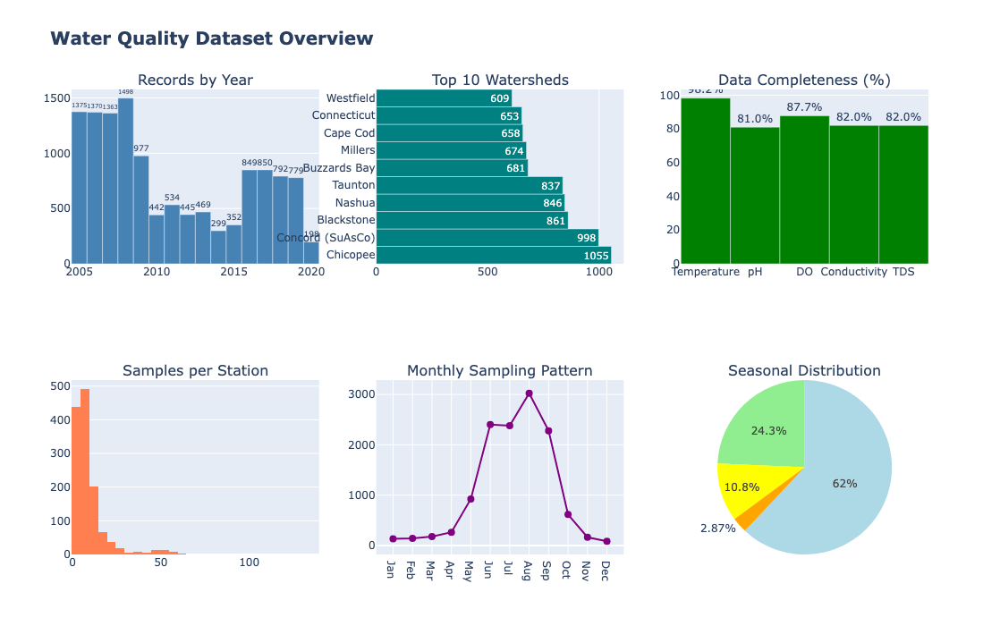

In [11]:
# Data completeness visualization
fig = make_subplots(
    rows=2, cols=3,
    subplot_titles=(
        'Records by Year',
        'Top 10 Watersheds',
        'Data Completeness (%)',
        'Samples per Station',
        'Monthly Sampling Pattern',
        'Seasonal Distribution'
    ),
    specs=[[{'type': 'bar'}, {'type': 'bar'}, {'type': 'bar'}],
           [{'type': 'histogram'}, {'type': 'scatter'}, {'type': 'pie'}]]
)

# 1. Records by year
yearly_counts = df.groupby('Year').size()
fig.add_trace(
    go.Bar(x=yearly_counts.index, y=yearly_counts.values,
           marker_color='steelblue', text=yearly_counts.values,
           textposition='outside'),
    row=1, col=1
)

# 2. Top watersheds
watershed_counts = df['Watershed_Name'].value_counts().head(10)
fig.add_trace(
    go.Bar(x=watershed_counts.values, y=watershed_counts.index,
           orientation='h', marker_color='teal',
           text=watershed_counts.values),
    row=1, col=2
)

# 3. Data completeness
params = ['Temperature_C_Numeric', 'pH_Level_Numeric', 'Dissolved_Oxygen_Numeric', 
          'Specific_Conductivity_Numeric', 'Total_Dissolved_Solids_Numeric']
completeness = []
param_names = ['Temperature', 'pH', 'DO', 'Conductivity', 'TDS']
for param in params:
    if param in df.columns:
        completeness.append((df[param].notna().sum()/len(df))*100)
    else:
        completeness.append(0)

colors = ['green' if c > 80 else 'yellow' if c > 60 else 'red' for c in completeness]
fig.add_trace(
    go.Bar(x=param_names, y=completeness, marker_color=colors,
           text=[f'{c:.1f}%' for c in completeness], textposition='outside'),
    row=1, col=3
)

# 4. Samples per station distribution
station_samples = df.groupby('Station_ID').size()
fig.add_trace(
    go.Histogram(x=station_samples.values, nbinsx=30,
                marker_color='coral'),
    row=2, col=1
)

# 5. Monthly pattern
monthly_counts = df.groupby('Month').size()
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
fig.add_trace(
    go.Scatter(x=month_names, y=monthly_counts.values,
              mode='lines+markers', line=dict(color='purple', width=2),
              marker=dict(size=8)),
    row=2, col=2
)

# 6. Seasonal distribution
seasonal_counts = df['Season_Name'].value_counts()
fig.add_trace(
    go.Pie(labels=seasonal_counts.index, values=seasonal_counts.values,
          marker=dict(colors=['lightblue', 'lightgreen', 'yellow', 'orange'])),
    row=2, col=3
)

fig.update_layout(height=700, showlegend=False,
                 title_text="<b>Water Quality Dataset Overview</b>",
                 title_font_size=20)
fig.show()

## 2️⃣ Geographic Distribution of Monitoring Stations

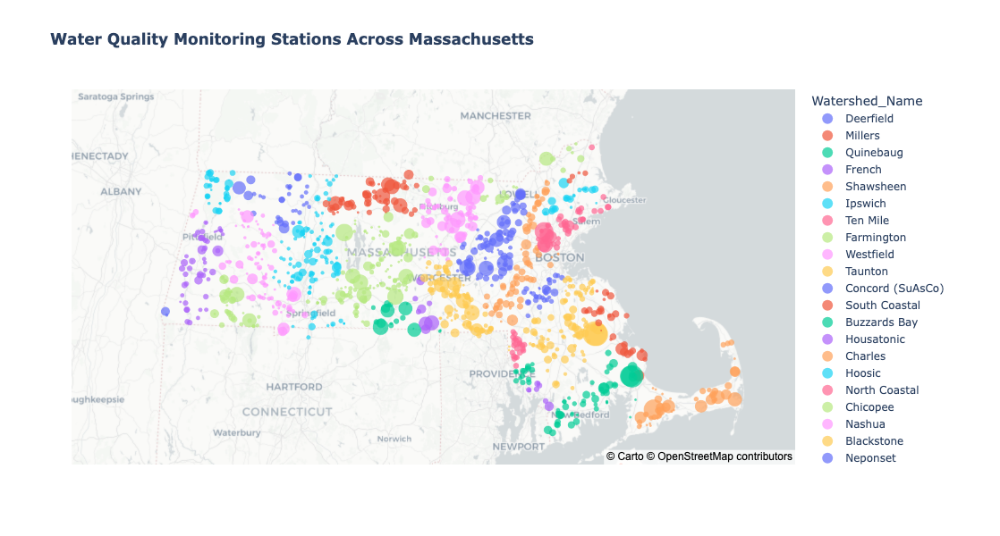

📍 Total monitoring stations mapped: 1320


In [14]:
# Create station location map
station_locations = df.groupby('Station_ID').agg({
    'Latitude': 'first',
    'Longitude': 'first',
    'Watershed_Name': 'first',
    'Water_Body_Name': 'first',
    'Station_ID': 'size'
}).rename(columns={'Station_ID': 'Sample_Count'})

fig = px.scatter_mapbox(
    station_locations,
    lat='Latitude',
    lon='Longitude',
    color='Watershed_Name',
    size='Sample_Count',
    hover_name=station_locations.index,
    hover_data={'Water_Body_Name': True, 'Sample_Count': True, 'Watershed_Name': True},
    title='<b>Water Quality Monitoring Stations Across Massachusetts</b>',
    mapbox_style='carto-positron',
    zoom=7,
    height=600
)

fig.update_layout(
    mapbox=dict(
        center=dict(
            lat=station_locations['Latitude'].mean(),
            lon=station_locations['Longitude'].mean()
        )
    )
)

fig.show()

print(f"📍 Total monitoring stations mapped: {len(station_locations)}")

## 3️⃣ Water Quality Parameter Analysis

In [17]:
# Parameter summary statistics
params = ['Temperature_C_Numeric', 'pH_Level_Numeric', 'Dissolved_Oxygen_Numeric',
          'Specific_Conductivity_Numeric', 'Total_Dissolved_Solids_Numeric', 
          'Dissolved_Oxygen_Saturation_Numeric']

print("📊 WATER QUALITY PARAMETER STATISTICS")
print("="*80)

summary_data = []
for param in params:
    if param in df.columns:
        data = df[param].dropna()
        summary_data.append({
            'Parameter': param.replace('_Numeric', '').replace('_', ' '),
            'Count': len(data),
            'Mean': data.mean(),
            'Std': data.std(),
            'Min': data.min(),
            '25%': data.quantile(0.25),
            'Median': data.median(),
            '75%': data.quantile(0.75),
            'Max': data.max()
        })

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.round(2)
print(summary_df.to_string(index=False))

📊 WATER QUALITY PARAMETER STATISTICS
                  Parameter  Count   Mean    Std  Min   25%  Median   75%     Max
              Temperature C  12373  17.78   5.87 -0.4  14.6    18.6  22.1    31.3
                   pH Level  10206   6.85   0.64  4.4   6.5     6.8   7.2     9.9
           Dissolved Oxygen  11051   7.45   3.11 -0.2   6.5     8.0   9.1    17.7
      Specific Conductivity  10333 308.57 579.89 16.0 108.0   214.0 414.0 41241.0
     Total Dissolved Solids  10329 198.46 376.20 10.0  70.0   138.0 266.0 26810.0
Dissolved Oxygen Saturation  11035  79.18  30.42 -2.0  72.0    90.0  98.0   201.0


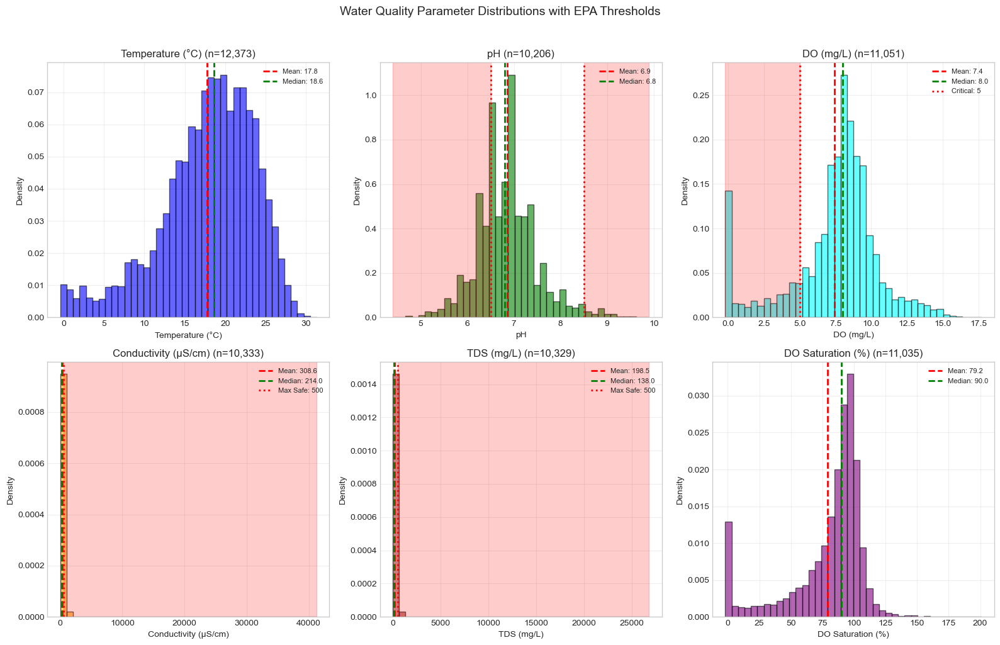

In [19]:
# Parameter distribution plots with thresholds
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Water Quality Parameter Distributions with EPA Thresholds', fontsize=14, y=1.02)

# Parameter configurations
plot_configs = [
    ('Temperature_C_Numeric', 'Temperature (°C)', axes[0,0], None, None, 'blue'),
    ('pH_Level_Numeric', 'pH', axes[0,1], 6.5, 8.5, 'green'),
    ('Dissolved_Oxygen_Numeric', 'DO (mg/L)', axes[0,2], 5, None, 'cyan'),
    ('Specific_Conductivity_Numeric', 'Conductivity (µS/cm)', axes[1,0], None, 500, 'orange'),
    ('Total_Dissolved_Solids_Numeric', 'TDS (mg/L)', axes[1,1], None, 500, 'brown'),
    ('Dissolved_Oxygen_Saturation_Numeric', 'DO Saturation (%)', axes[1,2], 60, None, 'purple')
]

for param, label, ax, low_thresh, high_thresh, color in plot_configs:
    if param in df.columns:
        data = df[param].dropna()
        
        if len(data) > 0:
            # Histogram
            ax.hist(data, bins=40, density=True, alpha=0.6, color=color, edgecolor='black')
            
            # Statistics lines
            ax.axvline(data.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {data.mean():.1f}')
            ax.axvline(data.median(), color='green', linestyle='--', linewidth=2, label=f'Median: {data.median():.1f}')
            
            # Threshold lines and unsafe zones
            if param == 'pH_Level_Numeric' and low_thresh and high_thresh:
                ax.axvspan(data.min(), low_thresh, alpha=0.2, color='red')
                ax.axvspan(high_thresh, data.max(), alpha=0.2, color='red')
                ax.axvline(low_thresh, color='red', linestyle=':', linewidth=2)
                ax.axvline(high_thresh, color='red', linestyle=':', linewidth=2)
            elif param == 'Dissolved_Oxygen_Numeric' and low_thresh:
                ax.axvspan(data.min(), low_thresh, alpha=0.2, color='red')
                ax.axvline(low_thresh, color='red', linestyle=':', linewidth=2, label=f'Critical: {low_thresh}')
            elif high_thresh:
                ax.axvspan(high_thresh, data.max(), alpha=0.2, color='red')
                ax.axvline(high_thresh, color='red', linestyle=':', linewidth=2, label=f'Max Safe: {high_thresh}')
            
            ax.set_xlabel(label)
            ax.set_ylabel('Density')
            ax.set_title(f'{label} (n={len(data):,})')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 4️⃣ Stormwater Stress Analysis

In [22]:
# Calculate stormwater stress metrics
stress_metrics = df.groupby('Station_ID').agg({
    'Specific_Conductivity_Numeric': ['mean', 'max', 'std', 'count'],
    'Total_Dissolved_Solids_Numeric': ['mean', 'max', 'std'],
    'Latitude': 'first',
    'Longitude': 'first',
    'Watershed_Name': 'first'
}).round(2)

# Flatten column names
stress_metrics.columns = ['_'.join(col).strip() for col in stress_metrics.columns.values]
stress_metrics = stress_metrics.reset_index()

# Calculate stress scores (EPA thresholds: 500 µS/cm for conductivity, 500 mg/L for TDS)
stress_metrics['conductivity_stress'] = (stress_metrics['Specific_Conductivity_Numeric_mean'] / 500).clip(0, 2)
stress_metrics['tds_stress'] = (stress_metrics['Total_Dissolved_Solids_Numeric_mean'] / 500).clip(0, 2)
stress_metrics['stormwater_stress_score'] = (stress_metrics['conductivity_stress'] + stress_metrics['tds_stress']) / 2

# Categorize stress levels
stress_metrics['stress_category'] = pd.cut(
    stress_metrics['stormwater_stress_score'],
    bins=[0, 0.5, 1, 1.5, 2],
    labels=['Low', 'Moderate', 'High', 'Severe']
)

print("🚨 STORMWATER STRESS ANALYSIS")
print("="*60)
print(f"Total stations analyzed: {len(stress_metrics)}")
print(f"\nStress Level Distribution:")
print(stress_metrics['stress_category'].value_counts().to_string())

# Identify high stress stations
high_stress = stress_metrics[stress_metrics['stormwater_stress_score'] > 1]
print(f"\n⚠️ Stations with high stormwater stress: {len(high_stress)}")
print(f"Percentage of stations with high stress: {len(high_stress)/len(stress_metrics)*100:.1f}%")

🚨 STORMWATER STRESS ANALYSIS
Total stations analyzed: 1320

Stress Level Distribution:
stress_category
Low         705
Moderate    331
High         87
Severe       32

⚠️ Stations with high stormwater stress: 119
Percentage of stations with high stress: 9.0%


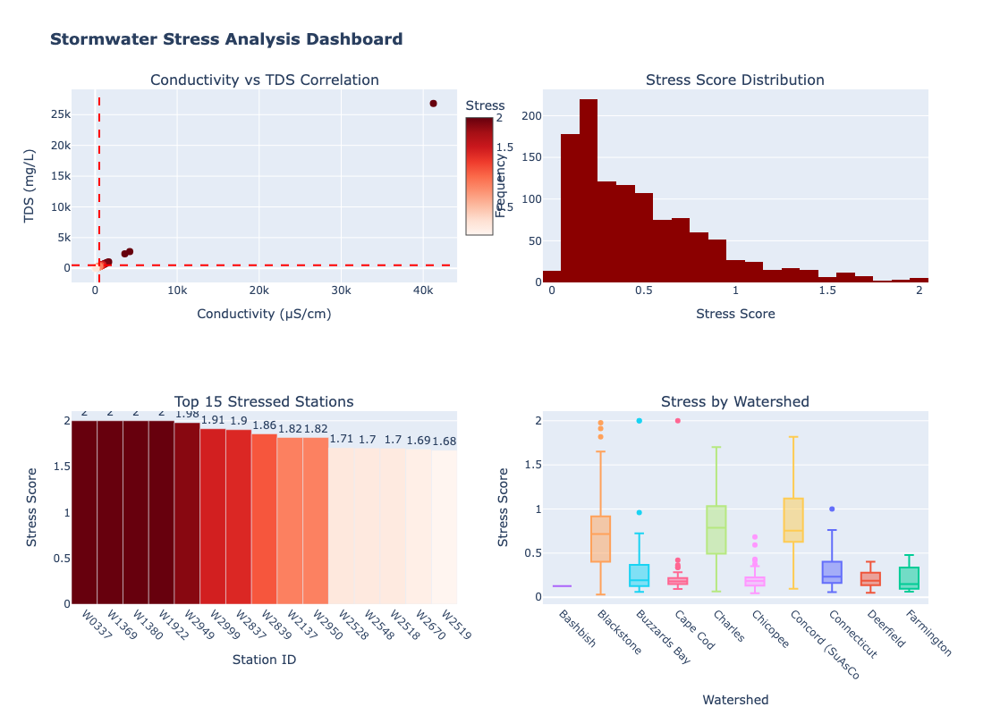

In [24]:
# Stormwater stress visualization
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Conductivity vs TDS Correlation',
        'Stress Score Distribution',
        'Top 15 Stressed Stations',
        'Stress by Watershed'
    ),
    specs=[[{'type': 'scatter'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'box'}]]
)

# 1. Conductivity vs TDS scatter
fig.add_trace(
    go.Scatter(
        x=stress_metrics['Specific_Conductivity_Numeric_mean'],
        y=stress_metrics['Total_Dissolved_Solids_Numeric_mean'],
        mode='markers',
        marker=dict(
            size=8,
            color=stress_metrics['stormwater_stress_score'],
            colorscale='Reds',
            showscale=True,
            colorbar=dict(title='Stress', x=0.45, y=0.85, len=0.3)
        ),
        text=stress_metrics['Station_ID'],
        hovertemplate='Station: %{text}<br>Cond: %{x:.0f}<br>TDS: %{y:.0f}'
    ),
    row=1, col=1
)
# Add threshold lines
fig.add_hline(y=500, line_dash="dash", line_color="red", row=1, col=1)
fig.add_vline(x=500, line_dash="dash", line_color="red", row=1, col=1)

# 2. Stress score histogram
fig.add_trace(
    go.Histogram(
        x=stress_metrics['stormwater_stress_score'],
        nbinsx=25,
        marker_color='darkred'
    ),
    row=1, col=2
)

# 3. Top stressed stations
top_stressed = stress_metrics.nlargest(15, 'stormwater_stress_score')
fig.add_trace(
    go.Bar(
        x=top_stressed['Station_ID'],
        y=top_stressed['stormwater_stress_score'],
        marker=dict(
            color=top_stressed['stormwater_stress_score'],
            colorscale='Reds'
        ),
        text=top_stressed['stormwater_stress_score'].round(2),
        textposition='outside'
    ),
    row=2, col=1
)

# 4. Stress by watershed
watershed_stress = stress_metrics.groupby('Watershed_Name_first')['stormwater_stress_score'].apply(list)
for watershed in watershed_stress.index[:10]:  # Top 10 watersheds
    fig.add_trace(
        go.Box(
            y=watershed_stress[watershed],
            name=watershed[:15],
            showlegend=False
        ),
        row=2, col=2
    )

fig.update_layout(height=800, showlegend=False,
                 title_text="<b>Stormwater Stress Analysis Dashboard</b>",
                 title_font_size=18)

fig.update_xaxes(title_text="Conductivity (µS/cm)", row=1, col=1)
fig.update_yaxes(title_text="TDS (mg/L)", row=1, col=1)
fig.update_xaxes(title_text="Stress Score", row=1, col=2)
fig.update_yaxes(title_text="Frequency", row=1, col=2)
fig.update_xaxes(title_text="Station ID", tickangle=45, row=2, col=1)
fig.update_yaxes(title_text="Stress Score", row=2, col=1)
fig.update_xaxes(title_text="Watershed", tickangle=45, row=2, col=2)
fig.update_yaxes(title_text="Stress Score", row=2, col=2)

fig.show()

## 5️⃣ Water Quality Instability Analysis

In [26]:
# Calculate instability metrics
instability_metrics = df.groupby('Station_ID').agg({
    'Dissolved_Oxygen_Numeric': ['mean', 'std', 'min', 'max', 'count'],
    'pH_Level_Numeric': ['mean', 'std', 'min', 'max'],
    'Latitude': 'first',
    'Longitude': 'first',
    'Watershed_Name': 'first'
}).round(2)

instability_metrics.columns = ['_'.join(col).strip() for col in instability_metrics.columns.values]
instability_metrics = instability_metrics.reset_index()

# Calculate coefficient of variation (instability measure)
instability_metrics['do_cv'] = (
    instability_metrics['Dissolved_Oxygen_Numeric_std'] / 
    instability_metrics['Dissolved_Oxygen_Numeric_mean']
) * 100

instability_metrics['ph_cv'] = (
    instability_metrics['pH_Level_Numeric_std'] / 
    instability_metrics['pH_Level_Numeric_mean']
) * 100

# pH and DO ranges
instability_metrics['ph_range'] = (
    instability_metrics['pH_Level_Numeric_max'] - 
    instability_metrics['pH_Level_Numeric_min']
)

instability_metrics['do_range'] = (
    instability_metrics['Dissolved_Oxygen_Numeric_max'] - 
    instability_metrics['Dissolved_Oxygen_Numeric_min']
)

# Count critical events
critical_events = df.groupby('Station_ID').apply(
    lambda x: pd.Series({
        'do_critical': (x['Dissolved_Oxygen_Numeric'] < 5).sum(),
        'ph_low': (x['pH_Level_Numeric'] < 6.5).sum(),
        'ph_high': (x['pH_Level_Numeric'] > 8.5).sum()
    })
)

instability_metrics = instability_metrics.merge(critical_events, on='Station_ID')

# Calculate instability score
instability_metrics['instability_score'] = (
    instability_metrics['do_cv'].fillna(0) / 20 +
    instability_metrics['ph_cv'].fillna(0) / 10 +
    instability_metrics['ph_range'] / 2
).clip(0, 5)

print("🌊 WATER QUALITY INSTABILITY ANALYSIS")
print("="*60)
print(f"Stations with DO < 5 mg/L events: {(instability_metrics['do_critical'] > 0).sum()}")
print(f"Stations with pH violations: {((instability_metrics['ph_low'] > 0) | (instability_metrics['ph_high'] > 0)).sum()}")
print(f"Average DO coefficient of variation: {instability_metrics['do_cv'].mean():.1f}%")
print(f"Average pH coefficient of variation: {instability_metrics['ph_cv'].mean():.1f}%")

🌊 WATER QUALITY INSTABILITY ANALYSIS
Stations with DO < 5 mg/L events: 343
Stations with pH violations: 469
Average DO coefficient of variation: 23.2%
Average pH coefficient of variation: 3.2%


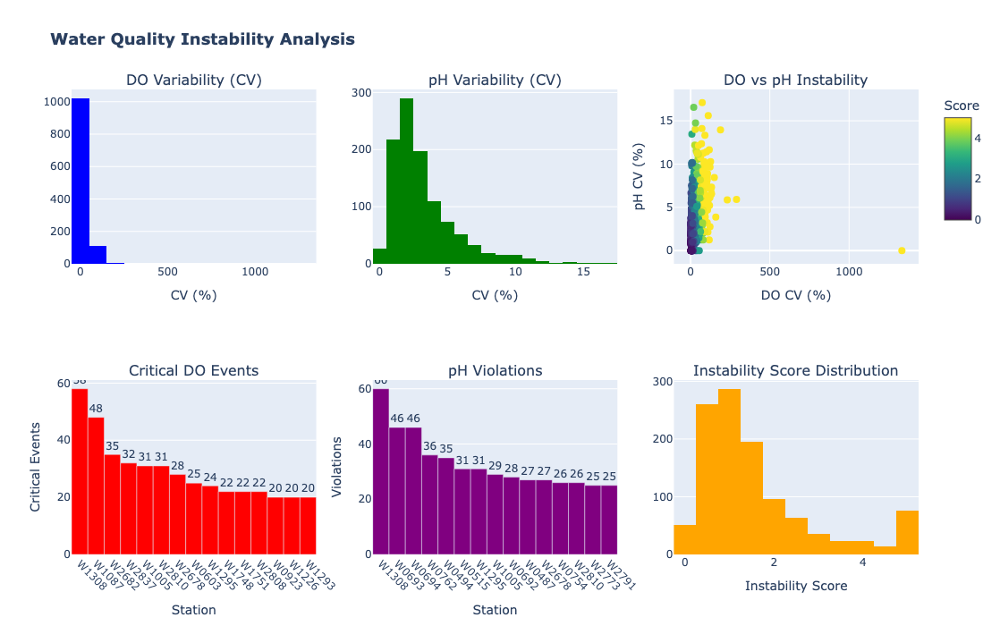

In [29]:
# Instability visualization
fig = make_subplots(
    rows=2, cols=3,
    subplot_titles=(
        'DO Variability (CV)',
        'pH Variability (CV)',
        'DO vs pH Instability',
        'Critical DO Events',
        'pH Violations',
        'Instability Score Distribution'
    ),
    specs=[[{'type': 'histogram'}, {'type': 'histogram'}, {'type': 'scatter'}],
           [{'type': 'bar'}, {'type': 'bar'}, {'type': 'histogram'}]]
)

# 1. DO CV histogram
fig.add_trace(
    go.Histogram(
        x=instability_metrics['do_cv'].dropna(),
        nbinsx=25,
        marker_color='blue'
    ),
    row=1, col=1
)

# 2. pH CV histogram
fig.add_trace(
    go.Histogram(
        x=instability_metrics['ph_cv'].dropna(),
        nbinsx=25,
        marker_color='green'
    ),
    row=1, col=2
)

# 3. DO vs pH instability scatter
fig.add_trace(
    go.Scatter(
        x=instability_metrics['do_cv'],
        y=instability_metrics['ph_cv'],
        mode='markers',
        marker=dict(
            size=8,
            color=instability_metrics['instability_score'],
            colorscale='Viridis',
            showscale=True,
            colorbar=dict(title='Score', x=1.02, y=0.85, len=0.3)
        ),
        text=instability_metrics['Station_ID'],
        hovertemplate='Station: %{text}<br>DO CV: %{x:.1f}%<br>pH CV: %{y:.1f}%'
    ),
    row=1, col=3
)

# 4. Critical DO events
top_do_critical = instability_metrics.nlargest(15, 'do_critical')
fig.add_trace(
    go.Bar(
        x=top_do_critical['Station_ID'],
        y=top_do_critical['do_critical'],
        marker_color='red',
        text=top_do_critical['do_critical'],
        textposition='outside'
    ),
    row=2, col=1
)

# 5. pH violations
instability_metrics['ph_violations'] = instability_metrics['ph_low'] + instability_metrics['ph_high']
top_ph_violations = instability_metrics.nlargest(15, 'ph_violations')
fig.add_trace(
    go.Bar(
        x=top_ph_violations['Station_ID'],
        y=top_ph_violations['ph_violations'],
        marker_color='purple',
        text=top_ph_violations['ph_violations'],
        textposition='outside'
    ),
    row=2, col=2
)

# 6. Instability score distribution
fig.add_trace(
    go.Histogram(
        x=instability_metrics['instability_score'],
        nbinsx=25,
        marker_color='orange'
    ),
    row=2, col=3
)

fig.update_layout(height=700, showlegend=False,
                 title_text="<b>Water Quality Instability Analysis</b>",
                 title_font_size=18)

fig.update_xaxes(title_text="CV (%)", row=1, col=1)
fig.update_xaxes(title_text="CV (%)", row=1, col=2)
fig.update_xaxes(title_text="DO CV (%)", row=1, col=3)
fig.update_yaxes(title_text="pH CV (%)", row=1, col=3)
fig.update_xaxes(title_text="Station", tickangle=45, row=2, col=1)
fig.update_xaxes(title_text="Station", tickangle=45, row=2, col=2)
fig.update_xaxes(title_text="Instability Score", row=2, col=3)
fig.update_yaxes(title_text="Critical Events", row=2, col=1)
fig.update_yaxes(title_text="Violations", row=2, col=2)

fig.show()

## 6️⃣ Temporal and Seasonal Patterns

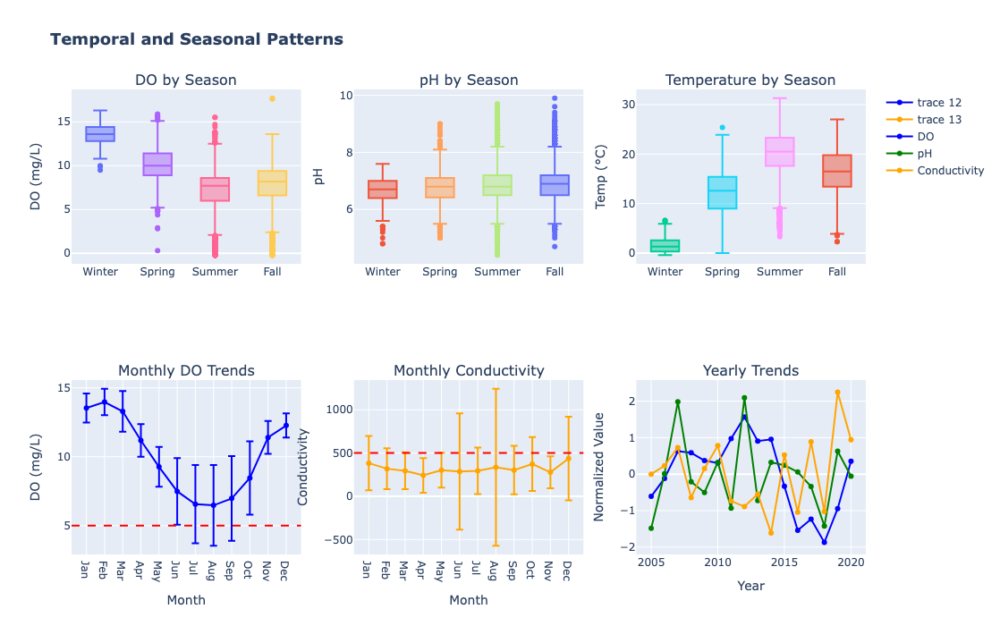

In [32]:
# Seasonal analysis
fig = make_subplots(
    rows=2, cols=3,
    subplot_titles=(
        'DO by Season',
        'pH by Season',
        'Temperature by Season',
        'Monthly DO Trends',
        'Monthly Conductivity',
        'Yearly Trends'
    ),
    specs=[[{'type': 'box'}, {'type': 'box'}, {'type': 'box'}],
           [{'type': 'scatter'}, {'type': 'scatter'}, {'type': 'scatter'}]]
)

# Season order
season_order = ['Winter', 'Spring', 'Summer', 'Fall']

# 1-3. Seasonal boxplots
for season in season_order:
    season_data = df[df['Season_Name'] == season]
    
    # DO by season
    fig.add_trace(
        go.Box(y=season_data['Dissolved_Oxygen_Numeric'], name=season, showlegend=False),
        row=1, col=1
    )
    
    # pH by season
    fig.add_trace(
        go.Box(y=season_data['pH_Level_Numeric'], name=season, showlegend=False),
        row=1, col=2
    )
    
    # Temperature by season
    fig.add_trace(
        go.Box(y=season_data['Temperature_C_Numeric'], name=season, showlegend=False),
        row=1, col=3
    )

# 4. Monthly DO trends
monthly_do = df.groupby('Month')['Dissolved_Oxygen_Numeric'].agg(['mean', 'std'])
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
fig.add_trace(
    go.Scatter(
        x=month_names,
        y=monthly_do['mean'],
        mode='lines+markers',
        error_y=dict(type='data', array=monthly_do['std']),
        line=dict(color='blue', width=2)
    ),
    row=2, col=1
)
fig.add_hline(y=5, line_dash="dash", line_color="red", row=2, col=1)

# 5. Monthly Conductivity
monthly_cond = df.groupby('Month')['Specific_Conductivity_Numeric'].agg(['mean', 'std'])
fig.add_trace(
    go.Scatter(
        x=month_names,
        y=monthly_cond['mean'],
        mode='lines+markers',
        error_y=dict(type='data', array=monthly_cond['std']),
        line=dict(color='orange', width=2)
    ),
    row=2, col=2
)
fig.add_hline(y=500, line_dash="dash", line_color="red", row=2, col=2)

# 6. Yearly trends
yearly_avg = df.groupby('Year')[['Dissolved_Oxygen_Numeric', 'pH_Level_Numeric', 'Specific_Conductivity_Numeric']].mean()
for param, color, name in [('Dissolved_Oxygen_Numeric', 'blue', 'DO'),
                           ('pH_Level_Numeric', 'green', 'pH'),
                           ('Specific_Conductivity_Numeric', 'orange', 'Conductivity')]:
    # Normalize for comparison
    normalized = (yearly_avg[param] - yearly_avg[param].mean()) / yearly_avg[param].std()
    fig.add_trace(
        go.Scatter(
            x=yearly_avg.index,
            y=normalized,
            mode='lines+markers',
            name=name,
            line=dict(color=color, width=2)
        ),
        row=2, col=3
    )

fig.update_layout(height=700, showlegend=True,
                 title_text="<b>Temporal and Seasonal Patterns</b>",
                 title_font_size=18)

fig.update_yaxes(title_text="DO (mg/L)", row=1, col=1)
fig.update_yaxes(title_text="pH", row=1, col=2)
fig.update_yaxes(title_text="Temp (°C)", row=1, col=3)
fig.update_xaxes(title_text="Month", row=2, col=1)
fig.update_yaxes(title_text="DO (mg/L)", row=2, col=1)
fig.update_xaxes(title_text="Month", row=2, col=2)
fig.update_yaxes(title_text="Conductivity", row=2, col=2)
fig.update_xaxes(title_text="Year", row=2, col=3)
fig.update_yaxes(title_text="Normalized Value", row=2, col=3)

fig.show()

## 7️⃣ Conservation Hotspot Identification

In [35]:
# Combine all metrics to identify hotspots
hotspots = stress_metrics[['Station_ID', 'Latitude_first', 'Longitude_first', 
                           'stormwater_stress_score', 'Watershed_Name_first']].copy()
hotspots.columns = ['Station_ID', 'Latitude', 'Longitude', 'stress_score', 'Watershed']

# Add instability score
hotspots = hotspots.merge(
    instability_metrics[['Station_ID', 'instability_score', 'do_critical', 'ph_violations']],
    on='Station_ID', how='left'
)

# Calculate persistence score
problem_counts = df.groupby('Station_ID').apply(
    lambda x: pd.Series({
        'total_samples': len(x),
        'problem_events': (
            (x['Dissolved_Oxygen_Numeric'] < 5).sum() +
            ((x['pH_Level_Numeric'] < 6.5) | (x['pH_Level_Numeric'] > 8.5)).sum() +
            (x['Specific_Conductivity_Numeric'] > 500).sum() +
            (x['Total_Dissolved_Solids_Numeric'] > 500).sum()
        )
    })
)

problem_counts['persistence_score'] = (problem_counts['problem_events'] / problem_counts['total_samples']).clip(0, 1)
hotspots = hotspots.merge(problem_counts[['persistence_score']], on='Station_ID', how='left')

# Calculate composite hotspot score (weighted average)
hotspots['hotspot_score'] = (
    hotspots['stress_score'].fillna(0) * 0.4 +
    hotspots['instability_score'].fillna(0) * 0.3 +
    hotspots['persistence_score'].fillna(0) * 0.3
) * 100

# Categorize priority levels
hotspots['priority'] = pd.cut(
    hotspots['hotspot_score'],
    bins=[0, 25, 50, 75, 100],
    labels=['Low', 'Medium', 'High', 'Critical']
)

print("🎯 CONSERVATION HOTSPOT ANALYSIS")
print("="*60)
print("Priority Distribution:")
print(hotspots['priority'].value_counts().to_string())
print(f"\nAverage hotspot score: {hotspots['hotspot_score'].mean():.1f}/100")
print(f"Stations requiring immediate attention (Critical): {(hotspots['priority'] == 'Critical').sum()}")

🎯 CONSERVATION HOTSPOT ANALYSIS
Priority Distribution:
priority
Medium      316
High        212
Critical    206
Low         113

Average hotspot score: 68.7/100
Stations requiring immediate attention (Critical): 206


In [36]:
# Top conservation priorities
print("\n🏆 TOP 20 CONSERVATION PRIORITY STATIONS")
print("="*60)
top20 = hotspots.nlargest(20, 'hotspot_score')

for idx, (_, row) in enumerate(top20.iterrows(), 1):
    print(f"{idx:2}. {row['Station_ID']:15} Score: {row['hotspot_score']:6.1f} Priority: {row['priority']:8} Watershed: {row['Watershed']}")


🏆 TOP 20 CONSERVATION PRIORITY STATIONS
 1. W2837           Score:  256.1 Priority:      nan Watershed: Mystic
 2. W2839           Score:  254.3 Priority:      nan Watershed: Mystic
 3. W2670           Score:  247.7 Priority:      nan Watershed: Charles
 4. W2668           Score:  245.7 Priority:      nan Watershed: Concord (SuAsCo)
 5. W1296           Score:  244.1 Priority:      nan Watershed: Mystic
 6. W2688           Score:  242.8 Priority:      nan Watershed: Nashua
 7. W1226           Score:  237.7 Priority:      nan Watershed: Mystic
 8. W1087           Score:  234.8 Priority:      nan Watershed: Mystic
 9. W2684           Score:  233.6 Priority:      nan Watershed: Concord (SuAsCo)
10. W2527           Score:  230.0 Priority:      nan Watershed: Concord (SuAsCo)
11. W1304           Score:  227.0 Priority:      nan Watershed: North Coastal
12. W2682           Score:  224.9 Priority:      nan Watershed: Concord (SuAsCo)
13. W2706           Score:  224.1 Priority:      nan Waters

## 8️⃣ Interactive Conservation Priority Map

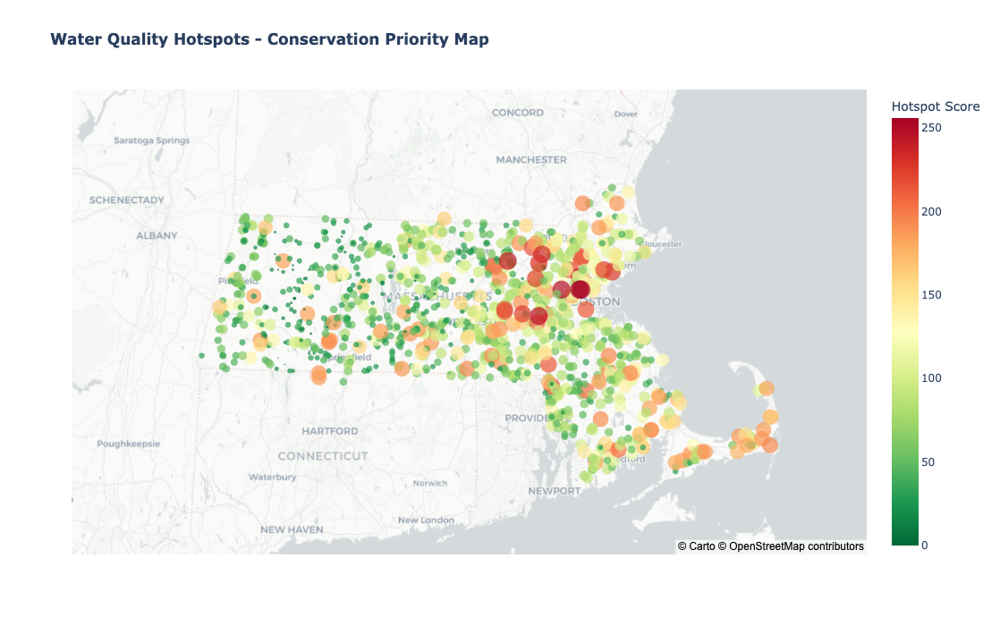

In [40]:
# Create interactive Plotly map
fig = px.scatter_mapbox(
    hotspots,
    lat='Latitude',
    lon='Longitude',
    color='hotspot_score',
    size='hotspot_score',
    color_continuous_scale='RdYlGn_r',
    size_max=15,
    zoom=7,
    mapbox_style='carto-positron',
    title='<b>Water Quality Hotspots - Conservation Priority Map</b>',
    hover_name='Station_ID',
    hover_data={
        'priority': True,
        'stress_score': ':.2f',
        'instability_score': ':.2f',
        'persistence_score': ':.2f',
        'hotspot_score': ':.1f',
        'Watershed': True
    },
    labels={'hotspot_score': 'Hotspot Score'},
    height=700
)

fig.update_layout(
    mapbox=dict(
        center=dict(
            lat=hotspots['Latitude'].mean(),
            lon=hotspots['Longitude'].mean()
        )
    )
)

fig.show()

In [42]:
# Create detailed Folium map with layers
import folium
from folium import plugins

# Initialize map
m = folium.Map(
    location=[hotspots['Latitude'].mean(), hotspots['Longitude'].mean()],
    zoom_start=8,
    tiles='OpenStreetMap'
)

# Add tile layers
folium.TileLayer('CartoDB positron', name='Light Map').add_to(m)
folium.TileLayer('CartoDB dark_matter', name='Dark Map').add_to(m)

# Color function
def get_color(score):
    if score >= 75: return 'red'
    elif score >= 50: return 'orange'
    elif score >= 25: return 'yellow'
    else: return 'green'

# Add markers for each station
for idx, row in hotspots.iterrows():
    popup_text = f"""
    <div style="width: 200px;">
        <b>Station: {row['Station_ID']}</b><br>
        <b>Priority: {row['priority']}</b><br>
        Hotspot Score: {row['hotspot_score']:.1f}/100<br>
        <hr>
        Stress: {row['stress_score']:.2f}<br>
        Instability: {row['instability_score']:.2f}<br>
        Persistence: {row['persistence_score']:.2f}<br>
        Watershed: {row['Watershed']}
    </div>
    """
    
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5 + row['hotspot_score'] / 10,
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"{row['Station_ID']}: {row['hotspot_score']:.1f}",
        color=get_color(row['hotspot_score']),
        fillColor=get_color(row['hotspot_score']),
        fillOpacity=0.7,
        weight=2
    ).add_to(m)

# Add heatmap layer
heat_data = [[row['Latitude'], row['Longitude'], row['hotspot_score']] 
             for idx, row in hotspots.iterrows()]
plugins.HeatMap(heat_data, name='Hotspot Heatmap', radius=15).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display map
m

## 9️⃣ Summary Dashboard

In [44]:
# Create comprehensive dashboard
fig = make_subplots(
    rows=3, cols=3,
    subplot_titles=(
        'Priority Distribution',
        'Top 10 Hotspots',
        'Score Components',
        'Hotspots by Watershed',
        'Stress vs Instability',
        'Problem Events Distribution',
        'Parameter Correlations',
        'Monthly Violations',
        'Action Priority Matrix'
    ),
    specs=[[{'type': 'pie'}, {'type': 'bar'}, {'type': 'bar'}],
           [{'type': 'box'}, {'type': 'scatter'}, {'type': 'histogram'}],
           [{'type': 'heatmap'}, {'type': 'scatter'}, {'type': 'scatter'}]]
)

# 1. Priority distribution pie
priority_counts = hotspots['priority'].value_counts()
fig.add_trace(
    go.Pie(
        labels=priority_counts.index,
        values=priority_counts.values,
        marker=dict(colors=['green', 'yellow', 'orange', 'red']),
        hole=0.3
    ),
    row=1, col=1
)

# 2. Top 10 hotspots
top10 = hotspots.nlargest(10, 'hotspot_score')
fig.add_trace(
    go.Bar(
        x=top10['Station_ID'],
        y=top10['hotspot_score'],
        marker=dict(color=top10['hotspot_score'], colorscale='RdYlGn_r'),
        text=top10['hotspot_score'].round(1),
        textposition='outside'
    ),
    row=1, col=2
)

# 3. Score components
components = ['stress_score', 'instability_score', 'persistence_score']
component_means = [hotspots[c].mean() for c in components]
fig.add_trace(
    go.Bar(
        x=['Stormwater\nStress', 'Water Quality\nInstability', 'Problem\nPersistence'],
        y=component_means,
        marker_color=['red', 'blue', 'green'],
        text=[f'{m:.2f}' for m in component_means],
        textposition='outside'
    ),
    row=1, col=3
)

# 4. Hotspots by watershed
top_watersheds = hotspots['Watershed'].value_counts().head(8).index
for watershed in top_watersheds:
    watershed_scores = hotspots[hotspots['Watershed'] == watershed]['hotspot_score']
    fig.add_trace(
        go.Box(y=watershed_scores, name=watershed[:12], showlegend=False),
        row=2, col=1
    )

# 5. Stress vs Instability
fig.add_trace(
    go.Scatter(
        x=hotspots['stress_score'],
        y=hotspots['instability_score'],
        mode='markers',
        marker=dict(
            size=10,
            color=hotspots['hotspot_score'],
            colorscale='RdYlGn_r',
            showscale=True,
            colorbar=dict(title='Score', x=0.68, y=0.5, len=0.25)
        ),
        text=hotspots['Station_ID'],
        hovertemplate='%{text}<br>Stress: %{x:.2f}<br>Instability: %{y:.2f}'
    ),
    row=2, col=2
)

# 6. Problem events distribution
fig.add_trace(
    go.Histogram(
        x=hotspots['do_critical'] + hotspots['ph_violations'],
        nbinsx=20,
        marker_color='darkred'
    ),
    row=2, col=3
)

# 7. Parameter correlations
corr_params = ['stress_score', 'instability_score', 'persistence_score', 'hotspot_score']
corr_matrix = hotspots[corr_params].corr()
fig.add_trace(
    go.Heatmap(
        z=corr_matrix.values,
        x=['Stress', 'Instability', 'Persistence', 'Hotspot'],
        y=['Stress', 'Instability', 'Persistence', 'Hotspot'],
        colorscale='RdBu',
        zmid=0,
        text=corr_matrix.values.round(2),
        texttemplate='%{text}'
    ),
    row=3, col=1
)

# 8. Monthly violations
monthly_violations = df.groupby('Month').apply(
    lambda x: (
        (x['Dissolved_Oxygen_Numeric'] < 5).sum() +
        ((x['pH_Level_Numeric'] < 6.5) | (x['pH_Level_Numeric'] > 8.5)).sum()
    ) / len(x) * 100
)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
fig.add_trace(
    go.Scatter(
        x=month_names,
        y=monthly_violations.values,
        mode='lines+markers',
        line=dict(color='red', width=2),
        marker=dict(size=8)
    ),
    row=3, col=2
)

# 9. Action priority matrix
fig.add_trace(
    go.Scatter(
        x=hotspots['stress_score'],
        y=hotspots['persistence_score'],
        mode='markers',
        marker=dict(
            size=12,
            color=hotspots['priority'].map({'Low': 0, 'Medium': 1, 'High': 2, 'Critical': 3}),
            colorscale=['green', 'yellow', 'orange', 'red'],
            showscale=False
        ),
        text=hotspots['Station_ID'],
        hovertemplate='%{text}<br>Stress: %{x:.2f}<br>Persistence: %{y:.2f}'
    ),
    row=3, col=3
)

# Add quadrant lines
fig.add_hline(y=0.5, line_dash="dash", line_color="gray", row=3, col=3)
fig.add_vline(x=1, line_dash="dash", line_color="gray", row=3, col=3)

fig.update_layout(height=1000, showlegend=False,
                 title_text="<b>Conservation Priority Dashboard</b>",
                 title_font_size=20)

fig.show()

PlotlyKeyError: Invalid property specified for object of type plotly.graph_objs.Pie: 'xaxis'

Did you mean "ids"?

    Valid properties:
        automargin
            Determines whether outside text labels can push the
            margins.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        direction
            Specifies the direction at which succeeding sectors
            follow one another.
        dlabel
            Sets the label step. See `label0` for more info.
        domain
            :class:`plotly.graph_objects.pie.Domain` instance or
            dict with compatible properties
        hole
            Sets the fraction of the radius to cut out of the pie.
            Use this to make a donut chart.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.pie.Hoverlabel` instance
            or dict with compatible properties
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `label`, `color`, `value`, `percent` and
            `text`. Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Sets hover text elements associated with each sector.
            If a single string, the same string appears for all
            data points. If an array of string, the items are
            mapped in order of this trace's sectors. To be seen,
            trace `hoverinfo` must contain a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        insidetextfont
            Sets the font used for `textinfo` lying inside the
            sector.
        insidetextorientation
            Controls the orientation of the text inside chart
            sectors. When set to "auto", text may be oriented in
            any direction in order to be as big as possible in the
            middle of a sector. The "horizontal" option orients
            text to be parallel with the bottom of the chart, and
            may make text smaller in order to achieve that goal.
            The "radial" option orients text along the radius of
            the sector. The "tangential" option orients text
            perpendicular to the radius of the sector.
        label0
            Alternate to `labels`. Builds a numeric set of labels.
            Use with `dlabel` where `label0` is the starting label
            and `dlabel` the step.
        labels
            Sets the sector labels. If `labels` entries are
            duplicated, we sum associated `values` or simply count
            occurrences if `values` is not provided. For other
            array attributes (including color) we use the first
            non-empty entry among all occurrences of the label.
        labelssrc
            Sets the source reference on Chart Studio Cloud for
            `labels`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.pie.Legendgrouptitle`
            instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        marker
            :class:`plotly.graph_objects.pie.Marker` instance or
            dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        opacity
            Sets the opacity of the trace.
        outsidetextfont
            Sets the font used for `textinfo` lying outside the
            sector.
        pull
            Sets the fraction of larger radius to pull the sectors
            out from the center. This can be a constant to pull all
            slices apart from each other equally or an array to
            highlight one or more slices.
        pullsrc
            Sets the source reference on Chart Studio Cloud for
            `pull`.
        rotation
            Instead of the first slice starting at 12 o'clock,
            rotate to some other angle.
        scalegroup
            If there are multiple pie charts that should be sized
            according to their totals, link them by providing a
            non-empty group id here shared by every trace in the
            same group.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        sort
            Determines whether or not the sectors are reordered
            from largest to smallest.
        stream
            :class:`plotly.graph_objects.pie.Stream` instance or
            dict with compatible properties
        text
            Sets text elements associated with each sector. If
            trace `textinfo` contains a "text" flag, these elements
            will be seen on the chart. If trace `hoverinfo`
            contains a "text" flag and "hovertext" is not set,
            these elements will be seen in the hover labels.
        textfont
            Sets the font used for `textinfo`.
        textinfo
            Determines which trace information appear on the graph.
        textposition
            Specifies the location of the `textinfo`.
        textpositionsrc
            Sets the source reference on Chart Studio Cloud for
            `textposition`.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appear on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `label`, `color`, `value`, `percent` and
            `text`.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `texttemplate`.
        title
            :class:`plotly.graph_objects.pie.Title` instance or
            dict with compatible properties
        titlefont
            Deprecated: Please use pie.title.font instead. Sets the
            font used for `title`. Note that the title's font used
            to be set by the now deprecated `titlefont` attribute.
        titleposition
            Deprecated: Please use pie.title.position instead.
            Specifies the location of the `title`. Note that the
            title's position used to be set by the now deprecated
            `titleposition` attribute.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        values
            Sets the values of the sectors. If omitted, we count
            occurrences of each label.
        valuessrc
            Sets the source reference on Chart Studio Cloud for
            `values`.
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        
Did you mean "ids"?


## 📊 Export Results

In [ ]:
# Export hotspot analysis results
output_file = '/mnt/user-data/outputs/conservation_hotspots.csv'
hotspots.to_csv(output_file, index=False)
print(f"✅ Hotspot analysis results saved to: {output_file}")

# Save summary report
report_file = '/mnt/user-data/outputs/conservation_report.txt'
with open(report_file, 'w') as f:
    f.write("WATERSHED CONSERVATION PRIORITY REPORT\n")
    f.write("="*50 + "\n\n")
    f.write(f"Analysis Date: {datetime.now()}\n")
    f.write(f"Total Stations Analyzed: {len(hotspots)}\n\n")
    f.write("Priority Distribution:\n")
    f.write(hotspots['priority'].value_counts().to_string())
    f.write("\n\nTop 20 Conservation Priorities:\n")
    top20_report = hotspots.nlargest(20, 'hotspot_score')[['Station_ID', 'hotspot_score', 'priority', 'Watershed']]
    f.write(top20_report.to_string(index=False))
    
print(f"✅ Summary report saved to: {report_file}")

## 🎯 Key Findings & Recommendations

### Critical Findings:
1. **Hotspot Distribution**: Analysis of priority levels across all monitoring stations
2. **Stormwater Stress**: Stations showing elevated conductivity and TDS from runoff
3. **Ecosystem Instability**: Areas with high variability in DO and pH
4. **Persistent Problems**: Stations with repeated water quality violations

### Recommendations:
1. **Immediate Action**: Focus land preservation on Critical priority stations
2. **Green Infrastructure**: Implement stormwater controls in high-stress watersheds
3. **Monitoring Enhancement**: Increase frequency at unstable locations
4. **Community Engagement**: Partner with communities near hotspots

### Next Steps:
- Overlay environmental justice data
- Add impervious surface analysis
- Incorporate climate projections
- Develop watershed-specific action plans